#Projet Data Science II

Jessica FORNETTI (AMSD)

##Dataset BBC

On importe le dataset bbc :

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
df = pd.read_csv('/content/bbc.csv')
df = df.drop(df.columns[[0]], axis=1)

df

,text,label
0,England coach faces rap after row\n\nEngland c...,sport
1,Moody joins up with England\n\nLewis Moody has...,sport
2,Ferguson fears Milan cutting edge\n\nMancheste...,sport
3,Henry tipped for Fifa award\n\nFifa president ...,sport
4,Arnesen denies rift with Santini\n\nTottenham ...,sport
...,...,...
2220,Commons hunt protest charges\n\nEight proteste...,politics
2221,UK set to cut back on embassies\n\nNine overse...,politics
2222,'Few ready' for information act\n\nThousands o...,politics
2223,Goldsmith: 'I was not leant on'\n\nThe attorne...,politics


On fait le preprocessing : enlever la ponctuation, mettre tout en miniscule, tokenizer, enlever les stopwords et lemmatizer

In [3]:
import re
import nltk
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('omw-1.4')
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

stop_words = stopwords.words('english')
lemmatizer = WordNetLemmatizer()

def data_preprocessing(review):
    
  # data cleaning
  review =  re.sub('[^A-Za-z0-9]+', ' ', review) #taking only words
  
  # lowercase
  review = review.lower()
  
  # tokenization
  tokens = nltk.word_tokenize(review) # converts review to tokens
  
  # stop_words removal
  review = [word for word in tokens if word not in stop_words] #removing stop words
  
  # lemmatization
  review = [lemmatizer.lemmatize(word) for word in review]
  
  # join words in preprocessed review
  review = ' '.join(review)
  
  return review

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


In [4]:
df['preprocessing'] = df['text'].apply(lambda review: data_preprocessing(review))
df.head()

,text,label,preprocessing
0,England coach faces rap after row\n\nEngland c...,sport,england coach face rap row england coach andy ...
1,Moody joins up with England\n\nLewis Moody has...,sport,moody join england lewis moody flown dublin jo...
2,Ferguson fears Milan cutting edge\n\nMancheste...,sport,ferguson fear milan cutting edge manchester un...
3,Henry tipped for Fifa award\n\nFifa president ...,sport,henry tipped fifa award fifa president sepp bl...
4,Arnesen denies rift with Santini\n\nTottenham ...,sport,arnesen denies rift santini tottenham sporting...


On créé la liste sentences contenant une liste de chaque texte sous forme de strings separés et la liste sentences2 sous forme de tuple contenant le label associé

In [5]:
sentences = [line for line in df['preprocessing'].apply(lambda review: str.split(review))]
sentences2 = [(sentences[i], df['label'][i]) for i in range(len(sentences))]

sentences2

[(['england',
   'coach',
   'face',
   'rap',
   'row',
   'england',
   'coach',
   'andy',
   'robinson',
   'facing',
   'disciplinary',
   'action',
   'criticising',
   'referee',
   'jonathan',
   'kaplan',
   'side',
   'six',
   'nation',
   'defeat',
   'ireland',
   'rugby',
   'football',
   'union',
   'rfu',
   'investigate',
   'robinson',
   'deciding',
   'lodge',
   'complaint',
   'kaplan',
   'robinson',
   'may',
   'even',
   'apologise',
   'comment',
   'order',
   'avoid',
   'sanction',
   'international',
   'rugby',
   'board',
   'robinson',
   'said',
   'livid',
   'kaplan',
   'decision',
   'saturday',
   'disallow',
   'two',
   'england',
   'try',
   'england',
   'coach',
   'went',
   'claim',
   'one',
   'side',
   'refereed',
   'reviewing',
   'tape',
   'match',
   'rfu',
   'decided',
   'formally',
   'complain',
   'irb',
   'standard',
   'kaplan',
   'refereeing',
   'instead',
   'rfu',
   'said',
   'statement',
   'would',
   'set',
  

On effectue une représentation textuelle Word2vec :

In [6]:
from gensim.models import Word2Vec

model = Word2Vec(sentences)
print(model)

Word2Vec<vocab=9655, vector_size=100, alpha=0.025>


On obtient un vocabulaire de 9655 mots qu'on store dans la liste words

In [7]:
words = list(model.wv.key_to_index.keys())
words

['said',
 'year',
 'mr',
 'would',
 'also',
 'people',
 'u',
 'new',
 'one',
 'time',
 'could',
 'game',
 'last',
 'first',
 'two',
 'say',
 'world',
 'government',
 'film',
 'uk',
 'company',
 'make',
 'firm',
 'best',
 'get',
 'like',
 'told',
 '1',
 'number',
 'back',
 'month',
 'service',
 'take',
 'made',
 'way',
 'country',
 'music',
 'player',
 'three',
 'many',
 'market',
 'set',
 'week',
 '000',
 'labour',
 'party',
 'next',
 'well',
 'show',
 'bbc',
 '2',
 'election',
 'day',
 'home',
 'minister',
 'sale',
 'want',
 'added',
 'win',
 'good',
 'go',
 'work',
 'plan',
 'second',
 'million',
 'may',
 'right',
 'technology',
 'mobile',
 'think',
 'come',
 '2004',
 'play',
 '6',
 'going',
 'part',
 'group',
 'still',
 'much',
 'england',
 'phone',
 'top',
 'award',
 'since',
 'see',
 'blair',
 '3',
 'use',
 'high',
 'report',
 'need',
 'tax',
 '10',
 'public',
 'system',
 'european',
 '4',
 'tv',
 'british',
 'end',
 '5',
 'five',
 'used',
 'news',
 'tory',
 'however',
 'share',
 

On utilise sentences2 pour avoir la liste des labels associés aux mots du vocabulaire, pour pouvoir comparer nos clusterings par la suite (en calculant les métrique NMI et ARI)

In [10]:
vocab_labels = []

for word in words:
  for j in range(len(sentences2)):
    if(word in sentences2[j][0]):
      vocab_labels.append(sentences2[j][1])
      break

#vocab_labels


On ne peut pas utiliser la version de la representation GloVe qui est donnée car le fichier est trop lord pour pouvoir être uploadé à Google Collab. En effet on voit un cercle rouge quand on essaie d'uploader le fichier glove.840B.300d.txt et on a l'erreur suivante qui prouve bien qu' il n'a pas pu upload le fichier car le fichier est introuvé ( No such file or directory: '/content/glove.840B.300d.txt')

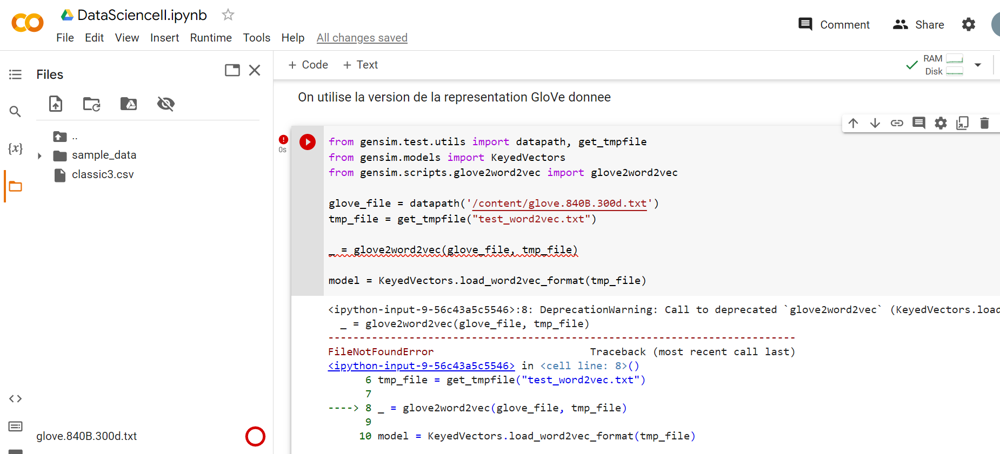

In [ ]:
from gensim.test.utils import datapath, get_tmpfile
from gensim.models import KeyedVectors
from gensim.scripts.glove2word2vec import glove2word2vec

glove_file = datapath('/content/glove.840B.300d.txt')
tmp_file = get_tmpfile("test_word2vec.txt")

_ = glove2word2vec(glove_file, tmp_file)

model = KeyedVectors.load_word2vec_format(tmp_file)

<ipython-input-10-56c43a5c5546>:8: DeprecationWarning: Call to deprecated `glove2word2vec` (KeyedVectors.load_word2vec_format(.., binary=False, no_header=True) loads GLoVE text vectors.).
  _ = glove2word2vec(glove_file, tmp_file)


FileNotFoundError: ignored

###Partie 1 : Approche Tandem

On voit qu'il y a en realité 5 vrai classes d'après la colone label des données

In [9]:
df['label'].unique()

array(['sport', 'entertainment', 'tech', 'business', 'politics'],
      dtype=object)

On convertit les labels en entiers pour pouvoir faire les comparaisons par la suite

In [11]:
vocab_labels2 = [0 if elem == 'sport' else elem for elem in vocab_labels]
vocab_labels2 = [1 if elem == 'entertainment' else elem for elem in vocab_labels2]
vocab_labels2 = [2 if elem == 'tech' else elem for elem in vocab_labels2]
vocab_labels2 = [3 if elem == 'business' else elem for elem in vocab_labels2]
vocab_labels2 = [4 if elem == 'politics' else elem for elem in vocab_labels2]

#vocab_labels2

On fait le scatter plot dans la dimension d'origine des vrai labels

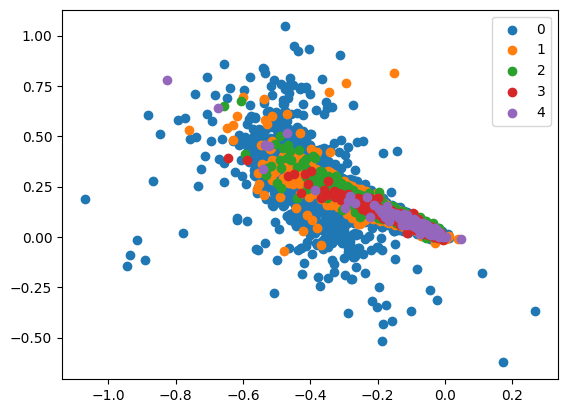

In [13]:
X = model.wv.vectors

label = vocab_labels2

u_labels = np.unique(vocab_labels2)

for i in u_labels:
    plt.scatter(X[label == i , 0] , X[label == i , 1] , label = i)
plt.legend()
plt.show()

####Clustering Kmeans++

#####Espace d'origine

On fait le clustering Kmeans++ dans l'espace d'origine. On garde les paramètres par défault : n_clusters=8 et init='k-means++' car il utilise par défault l'algorithme kmeans++

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


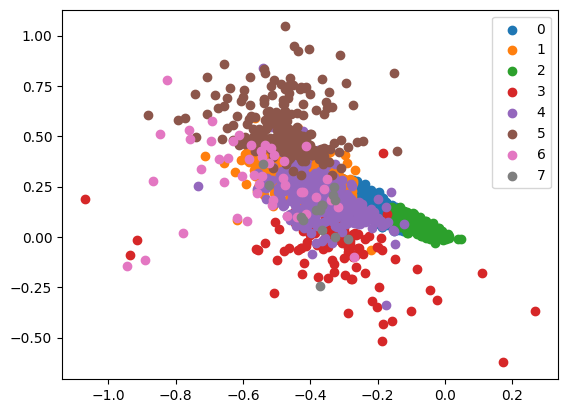

In [14]:
from sklearn.cluster import KMeans

X = model.wv.vectors

kmeans = KMeans()
label = kmeans.fit_predict(X)

u_labels = np.unique(label)

for i in u_labels:
    plt.scatter(X[label == i , 0] , X[label == i , 1] , label = i)
plt.legend()
plt.show()

Il nous trouve par défault beaucoup trop de classes, donc on met n_clusters=5 pour qu'il ait le bon nombre de classes et qu'on puisse évaluer et comparer les clusterings avec les métriques d'accuracy

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


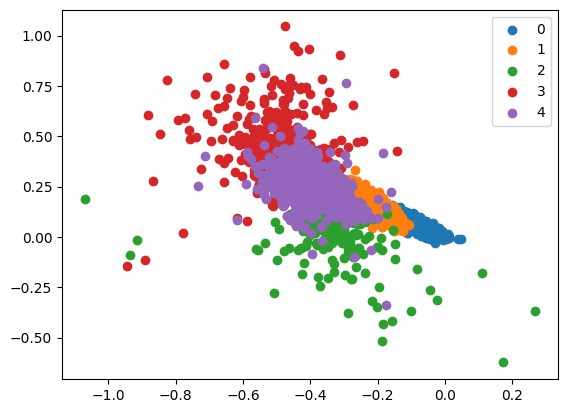

In [15]:
from sklearn.cluster import KMeans

X = model.wv.vectors

kmeans = KMeans(n_clusters=5)
label = kmeans.fit_predict(X)

u_labels = np.unique(label)

for i in u_labels:
    plt.scatter(X[label == i , 0] , X[label == i , 1] , label = i)
plt.legend()
plt.show()

On regarde ensuite les métriques d'accuracy NMI et ARI. Le score NMI est un score variant de 0 à 1 qui permet de mesurer l'exactitude de l'assignation des differents clusters. Le score ARI varie de -0.5 à 1. Un score de 1 veut dire un clustering presque parfait (les vrai labels et les labels predits coincident), un score de 0 signifie un clustering randomisé et un score de -0.5 correspond à un clustering pire que randomisé

In [16]:
from sklearn.metrics import normalized_mutual_info_score
from sklearn.metrics import adjusted_rand_score

nmi = normalized_mutual_info_score(vocab_labels2, label)
ari = adjusted_rand_score(vocab_labels2, label)

In [17]:
nmi

0.05231410299124997

In [18]:
ari

-0.08149502062495752

On obtient un score NMI et ARI très mauvais, en effet on voit bien que les clusters asignés par kmeans++ ne corespondent pas à ceux dans la realité

#####ACP

On fait une ACP avant le clustering

De même si on met n_clusters=5 il trouve bien le bon nombre de classes, mais sinon il trouve trop de classes

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


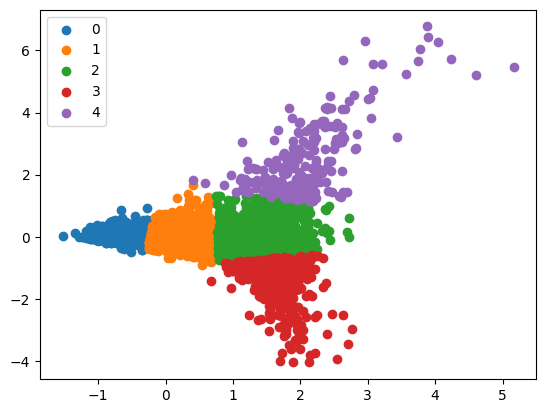

In [19]:
from sklearn.decomposition import PCA

X = model.wv.vectors
pca = PCA(n_components=2)
result = pca.fit_transform(X)

kmeans = KMeans(n_clusters=5)
label = kmeans.fit_predict(result)

u_labels = np.unique(label)

for i in u_labels:
    plt.scatter(result[label == i , 0] , result[label == i , 1] , label = i)
plt.legend()
plt.show()

On obtient les scores suivants:

In [20]:
nmi = normalized_mutual_info_score(vocab_labels2, label)
ari = adjusted_rand_score(vocab_labels2, label)

In [21]:
nmi

0.052381412336151505

In [22]:
ari

-0.08103135040169165

En regardant la vrai répartition des classes après une ACP, on voit bien que ce clustering nous donne de très mauvais resultats ce qui est confirmé par les métriques NMI et ARI

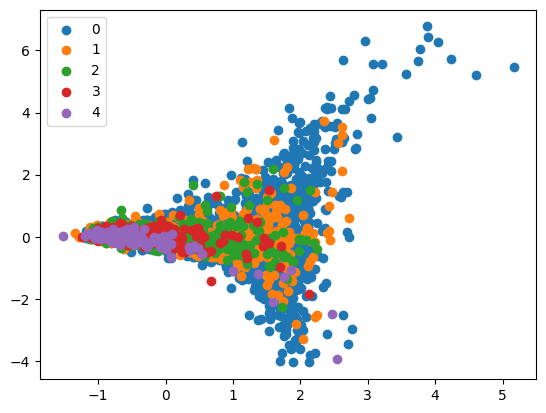

In [23]:
X = model.wv.vectors

label = vocab_labels2
pca = PCA(n_components=2)
result = pca.fit_transform(X)

u_labels = np.unique(vocab_labels2)

for i in u_labels:
    plt.scatter(result[label == i , 0] , result[label == i , 1] , label = i)
plt.legend()
plt.show()

#####T-SNE

On fait une réduction de dimension t-SNE avant le clustering

De même si on met n_clusters=5 l'algorithme trouve bien le bon nombre de classes, mais sinon il trouve trop de classes

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


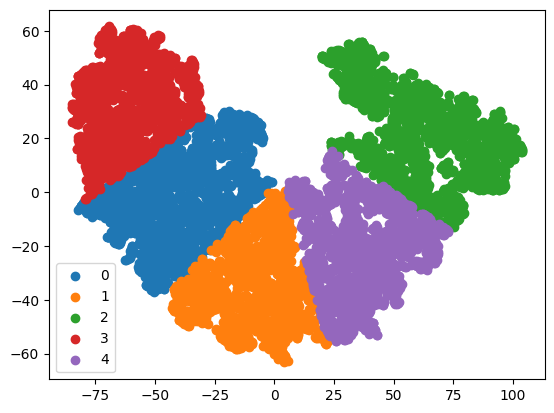

In [24]:
from sklearn.manifold import TSNE

X = model.wv.vectors
X_transforme = TSNE().fit_transform(X)

kmeans = KMeans(n_clusters=5)
label = kmeans.fit_predict(X_transforme)

u_labels = np.unique(label)

for i in u_labels:
    plt.scatter(X_transforme[label == i , 0] , X_transforme[label == i , 1] , label = i)
plt.legend()
plt.show()

On regarde les scores NMI et ARI :

In [25]:
nmi = normalized_mutual_info_score(vocab_labels2, label)
ari = adjusted_rand_score(vocab_labels2, label)

In [26]:
nmi

0.04936001379400231

In [27]:
ari

0.039333978854433065

On obtient de mauvais resultats, ce qui est confirmé en regardant la vrai répartition des classes après une réduction de dimension t-SNE:

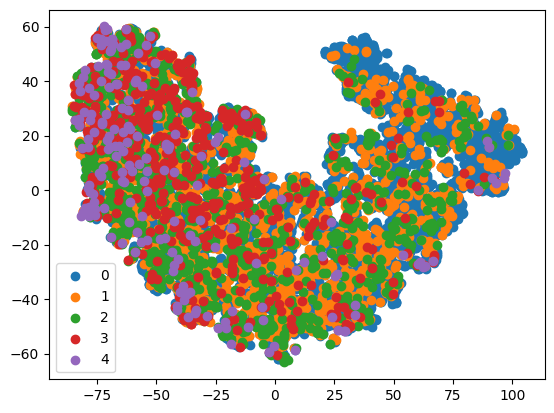

In [28]:
X = model.wv.vectors

label = vocab_labels2
result = TSNE().fit_transform(X)

u_labels = np.unique(vocab_labels2)

for i in u_labels:
    plt.scatter(result[label == i , 0] , result[label == i , 1] , label = i)
plt.legend()
plt.show()

#####UMAP

On fait une réduction de dimension UMAP avant le clustering

De même si on met n_clusters=5 l'algorithme trouve bien le bon nombre de classes, mais sinon il trouve trop de classes

In [29]:
! pip install umap-learn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.2/88.2 kB 3.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 23.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for umap-learn: filename=umap_learn-0.5.3-py3-none-any.whl size=82816 sha256=f3f39575f77a50d77379a29ff392fb0c932752b7b910aa8c1886cc1f9c10d91f
  Stored in directory: /root/.cache/pip/wheels/a0/e8/c6/a37ea663620bd5200ea1ba0907ab3c217042c1d035ef606acc
  Created wheel for pynndescent: filename=pynndescent-0.5.10-py3-none-any.whl size=55622 sha256=0d7b693966f4905ccd6686883da3c7e58f6bed943b547bee6b5f55a5c55cec5a
  Stored in directory: /root/.cache/pip/wheels/4a/38/5d/f60a40a66a9512b7e5e83517ebc2d1b42d857be97d135f1096
Successfully built umap-learn pynndescent


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


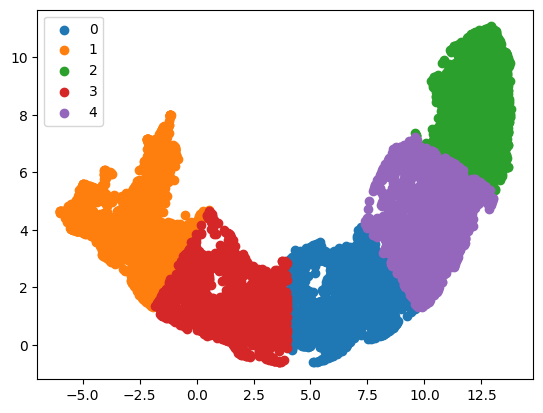

In [30]:
import umap

X = model.wv.vectors
X_transforme = umap.UMAP().fit_transform(X)

kmeans = KMeans(n_clusters=5)
label = kmeans.fit_predict(X_transforme)

u_labels = np.unique(label)

for i in u_labels:
    plt.scatter(X_transforme[label == i , 0] , X_transforme[label == i , 1] , label = i)
plt.legend()
plt.show()


On regarde les metriques NMI et ARI :


In [31]:
nmi = normalized_mutual_info_score(vocab_labels2, label)
ari = adjusted_rand_score(vocab_labels2, label)

In [32]:
nmi

0.04997210730310344

In [33]:
ari

0.028855198678977508

On obtient d'extremement mauvais score NMI et ARI, cela est bien confirmé en regardant la vrai répartition des classes après une réduction de dimension UMAP car on trouve des classes totalement differentes:

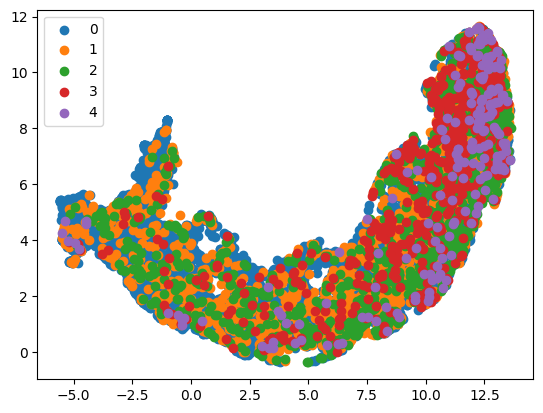

In [34]:
X = model.wv.vectors

label = vocab_labels2
X_transforme = umap.UMAP().fit_transform(X)

u_labels = np.unique(vocab_labels2)

for i in u_labels:
    plt.scatter(X_transforme[label == i , 0] , X_transforme[label == i , 1] , label = i)
plt.legend()
plt.show()

####Clustering Kmedoids

In [35]:
! pip install scikit-learn-extra

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 25.4 MB/s eta 0:00:00


#####Espace d'origine

On fait le clustering Kmedoids dans l'espace d'origine.
Comme l'algorithme ne trouve pas le bon nombre de classes, on met n_clusters=5 pour qu'on puisse évaluer et comparer avec les autres clusterings


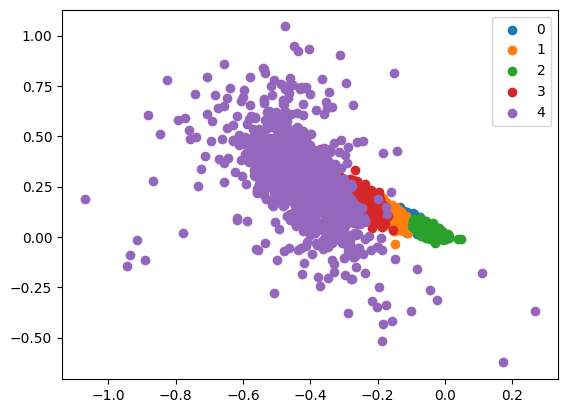

In [36]:
from sklearn_extra.cluster import KMedoids

X = model.wv.vectors

kmedoids = KMedoids(n_clusters=5)
label = kmedoids.fit_predict(X)

u_labels = np.unique(label)

for i in u_labels:
    plt.scatter(X[label == i , 0] , X[label == i , 1] , label = i)
plt.legend()
plt.show()

In [37]:
nmi = normalized_mutual_info_score(vocab_labels2, label)
ari = adjusted_rand_score(vocab_labels2, label)

In [38]:
nmi

0.04957329745671659

In [39]:
ari

0.000864345318026057

On obtient des scores extremement mauvais, en effet on voit bien que les clusters asignés par kmediods ne corespondent pas à ceux dans la realité


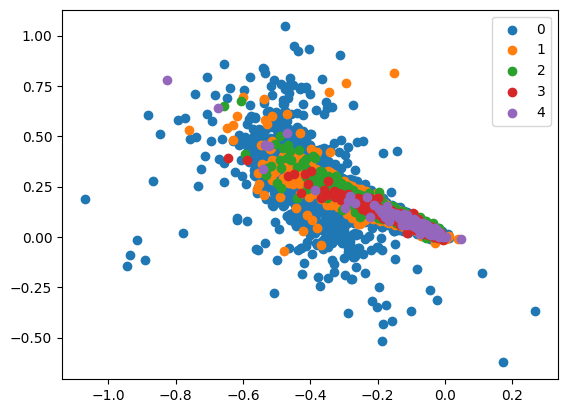

In [40]:
X = model.wv.vectors

label = vocab_labels2

u_labels = np.unique(vocab_labels2)

for i in u_labels:
    plt.scatter(X[label == i , 0] , X[label == i , 1] , label = i)
plt.legend()
plt.show()

#####ACP

On fait une ACP avant le clustering

De même si on met n_clusters=5 il trouve bien le bon nombre de classes, mais sinon il trouve trop de classes

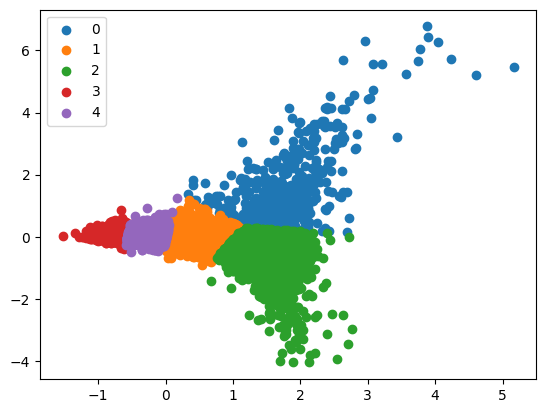

In [41]:
X = model.wv.vectors
pca = PCA(n_components=2)
result = pca.fit_transform(X)

kmedoids = KMedoids(n_clusters=5)
label = kmedoids.fit_predict(result)

u_labels = np.unique(label)

for i in u_labels:
    plt.scatter(result[label == i , 0] , result[label == i , 1] , label = i)
plt.legend()
plt.show()

On obtient les scores suivants:

In [42]:
nmi = normalized_mutual_info_score(vocab_labels2, label)
ari = adjusted_rand_score(vocab_labels2, label)

In [43]:
nmi

0.04997788232440424

In [44]:
ari

-0.033399872323133344

En regardant la vrai répartition des classes après une ACP, on voit bien que ce clustering nous donne de très mauvais resultats ce qui est confirmé par les métriques NMI et ARI


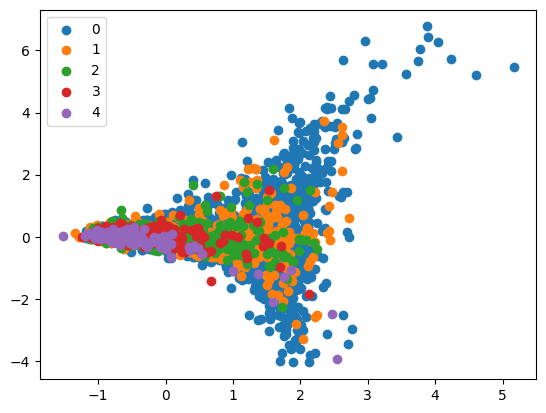

In [45]:
X = model.wv.vectors

label = vocab_labels2
pca = PCA(n_components=2)
result = pca.fit_transform(X)

u_labels = np.unique(vocab_labels2)

for i in u_labels:
    plt.scatter(result[label == i , 0] , result[label == i , 1] , label = i)
plt.legend()
plt.show()


#####T-SNE

On fait une réduction de dimension t-SNE avant le clustering

De même si on met n_clusters=5 l'algorithme trouve bien le bon nombre de classes, mais sinon il trouve trop de classes

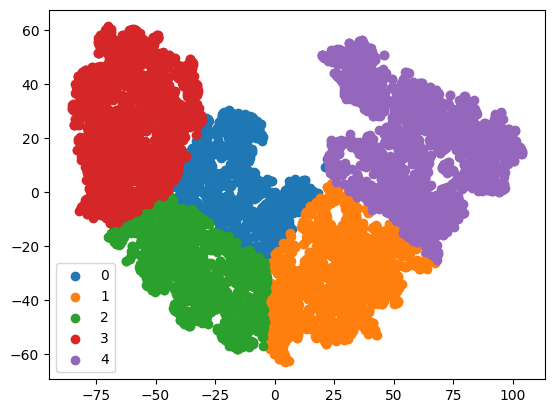

In [46]:
X = model.wv.vectors
X_transforme = TSNE().fit_transform(X)

kmedoids = KMedoids(n_clusters=5)
label = kmedoids.fit_predict(X_transforme)

u_labels = np.unique(label)

for i in u_labels:
    plt.scatter(X_transforme[label == i , 0] , X_transforme[label == i , 1] , label = i)
plt.legend()
plt.show()

On regarde les scores NMI et ARI :

In [47]:
nmi = normalized_mutual_info_score(vocab_labels2, label)
ari = adjusted_rand_score(vocab_labels2, label)

In [48]:
nmi

0.04930870360057466

In [49]:
ari

0.050916586443488

On obtient de tres mauvais resultats, ce qui est confirmé en regardant la vrai répartition des classes après une réduction de dimension t-SNE:


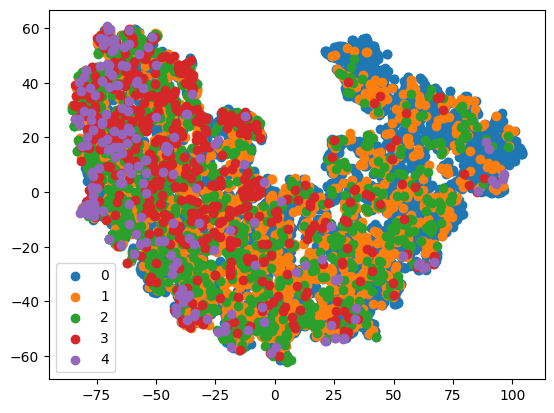

In [50]:
X = model.wv.vectors

label = vocab_labels2
result = TSNE().fit_transform(X)

u_labels = np.unique(vocab_labels2)

for i in u_labels:
    plt.scatter(result[label == i , 0] , result[label == i , 1] , label = i)
plt.legend()
plt.show()

#####UMAP

On fait une réduction de dimension UMAP avant le clustering

De même si on met n_clusters=5 l'algorithme trouve bien le bon nombre de classes, mais sinon il trouve trop de classes

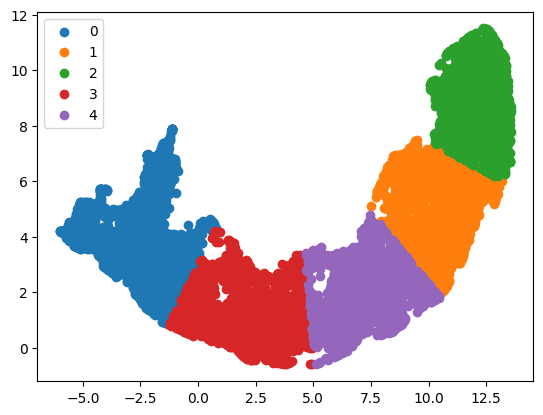

In [51]:
X = model.wv.vectors
X_transforme = umap.UMAP().fit_transform(X)

kmedoids = KMedoids(n_clusters=5)
label = kmedoids.fit_predict(X_transforme)

u_labels = np.unique(label)

for i in u_labels:
    plt.scatter(X_transforme[label == i , 0] , X_transforme[label == i , 1] , label = i)
plt.legend()
plt.show()

On regarde les metriques NMI et ARI :

In [52]:
nmi = normalized_mutual_info_score(vocab_labels2, label)
ari = adjusted_rand_score(vocab_labels2, label)

In [53]:
nmi

0.04910147315787224

In [54]:
ari

0.03860089011825389

On obtient d'extremement mauvais scores NMI et ARI, cela est bien confirmé en regardant la vrai répartition des classes après une réduction de dimension UMAP car on trouve des classes totalement differentes:


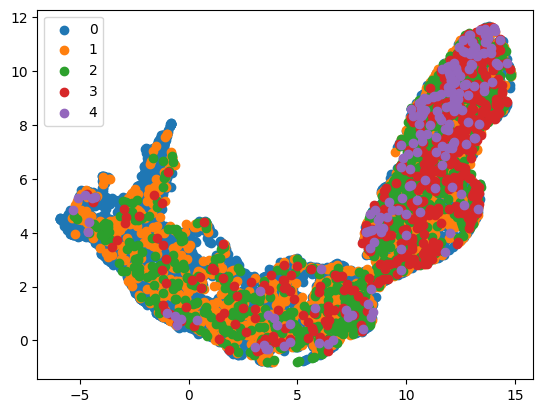

In [55]:
X = model.wv.vectors

label = vocab_labels2
X_transforme = umap.UMAP().fit_transform(X)

u_labels = np.unique(vocab_labels2)

for i in u_labels:
    plt.scatter(X_transforme[label == i , 0] , X_transforme[label == i , 1] , label = i)
plt.legend()
plt.show()



####Spherical Kmeans

In [56]:
! pip install coclust

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
  Created wheel for coclust: filename=coclust-0.2.1-py3-none-any.whl size=29853 sha256=a1e5456faa40928d00d532fed1879a3639eeda5984db0ddbb3f60ab24c8641b6
  Stored in directory: /root/.cache/pip/wheels/bf/93/3c/e90605656484712ead3e521b0d4d2c9d8cde8125a3ef6dd1df
Successfully built coclust


#####Espace d'origine

On fait le clustering SphericalKmeans dans l'espace d'origine. Comme l'algorithme ne trouve pas le bon nombre de classes, on met n_clusters=5 pour qu'on puisse évaluer et comparer avec les autres clusterings


 == New init == 
iteration: 0
9203.035117099465
iteration: 1
9372.772738595786
iteration: 2
9396.287051209836
iteration: 3
9406.167085193052
iteration: 4
9409.963463590098
iteration: 5
9412.434856524887
iteration: 6
9414.190816391658
iteration: 7
9415.554620676632
iteration: 8
9416.671979811383
iteration: 9
9417.492306443446
iteration: 10
9417.96676688724
iteration: 11
9418.198640605624
iteration: 12
9418.314280785575
iteration: 13
9418.373965467017
iteration: 14
9418.403778684333
iteration: 15
9418.426754426451
iteration: 16
9418.457093566625
iteration: 17
9418.484042528944
iteration: 18
9418.49467302246
iteration: 19
9418.501033269024


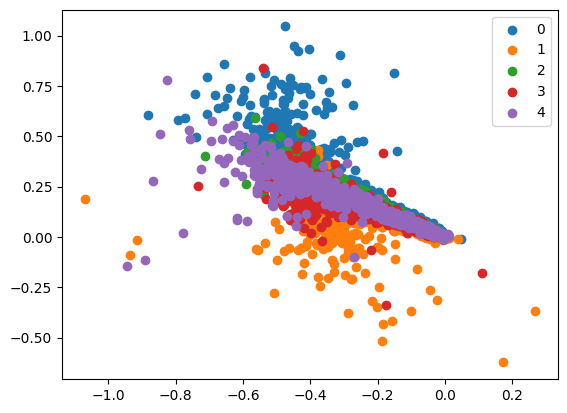

In [57]:
from coclust.clustering import SphericalKmeans

X = model.wv.vectors

skmeans = SphericalKmeans(n_clusters=5)
skmeans.fit(X)
label = skmeans.labels_

u_labels = np.unique(label)

for i in u_labels:
    plt.scatter(X[label == i , 0] , X[label == i , 1] , label = i)
plt.legend()
plt.show()


In [58]:
nmi = normalized_mutual_info_score(vocab_labels2, label)
ari = adjusted_rand_score(vocab_labels2, label)

In [59]:
nmi

0.011358824186159553

In [60]:
ari

-0.0107955521254383

On obtient des scores tres mauvais, en effet on voit bien que les clusters asignés par SphericalKmeans ne corespondent pas vraiment à ceux dans la realité

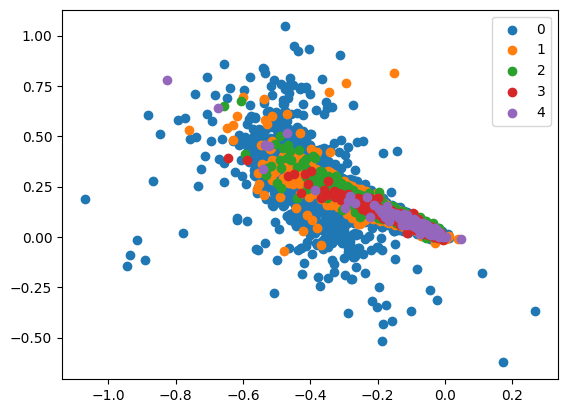

In [61]:
X = model.wv.vectors

label = vocab_labels2

u_labels = np.unique(vocab_labels2)

for i in u_labels:
    plt.scatter(X[label == i , 0] , X[label == i , 1] , label = i)
plt.legend()
plt.show()

#####ACP

On fait une ACP avant le clustering

De même si on met n_clusters=5 il trouve bien le bon nombre de classes, mais sinon il trouve trop de classes

 == New init == 
iteration: 0
2772.053652285031
iteration: 1
7969.5160316500815
iteration: 2
8901.813260323957
iteration: 3
8997.434815271756
iteration: 4
9072.839034465784
iteration: 5
9168.76840816227
iteration: 6
9244.724919133678
iteration: 7
9288.412860850243
iteration: 8
9309.291761966486
iteration: 9
9319.024708501413
iteration: 10
9322.823998051632
iteration: 11
9325.06297040198
iteration: 12
9326.82163303683
iteration: 13
9328.530859919736
iteration: 14
9330.486001938802
iteration: 15
9332.202420574093
iteration: 16
9334.01155534494
iteration: 17
9335.872735907997
iteration: 18
9337.383762313106
iteration: 19
9338.428830784615


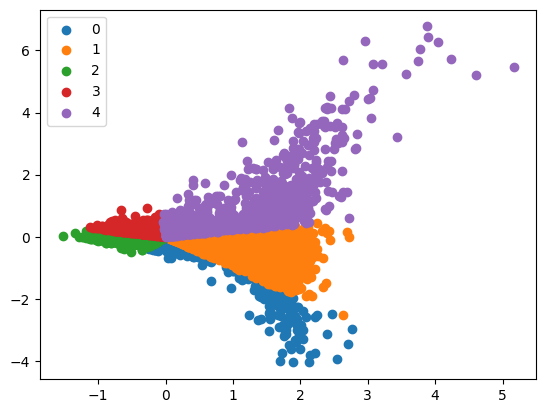

In [62]:
X = model.wv.vectors
pca = PCA(n_components=2)
result = pca.fit_transform(X)

skmeans = SphericalKmeans(n_clusters=5)
skmeans.fit(result)
label = skmeans.labels_

u_labels = np.unique(label)

for i in u_labels:
    plt.scatter(result[label == i , 0] , result[label == i , 1] , label = i)
plt.legend()
plt.show()

On obtient les metriques suivantes:

In [63]:
nmi = normalized_mutual_info_score(vocab_labels2, label)
ari = adjusted_rand_score(vocab_labels2, label)

In [64]:
nmi

0.04632067978944496

In [65]:
ari

-0.05979676164144826

En regardant la vrai répartition des classes après une ACP, on voit que ce clustering nous donne un très mauvais resultat ce qui est confirmé par les métriques NMI et ARI


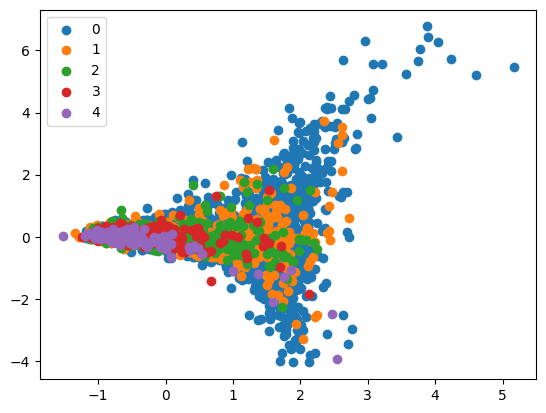

In [66]:
X = model.wv.vectors

label = vocab_labels2
pca = PCA(n_components=2)
result = pca.fit_transform(X)

u_labels = np.unique(vocab_labels2)

for i in u_labels:
    plt.scatter(result[label == i , 0] , result[label == i , 1] , label = i)
plt.legend()
plt.show()

#####T-SNE

On fait une réduction de dimension t-SNE avant le SphericalKmeans

De même si on met n_clusters=5 l'algorithme trouve bien le bon nombre de classes, mais sinon il trouve trop de classes

 == New init == 
iteration: 0
3177.569876655202
iteration: 1
8676.429355796665
iteration: 2
9016.723572207333
iteration: 3
9140.805519376137
iteration: 4
9196.098033920352
iteration: 5
9223.652965444722
iteration: 6
9234.881467004598
iteration: 7
9237.905296456047
iteration: 8
9238.946906914016
iteration: 9
9239.27949776945
iteration: 10
9239.506940437424
iteration: 11
9239.597791518388
iteration: 12
9239.636751973958
iteration: 13
9239.677062882572
iteration: 14
9239.69571073972
iteration: 15
9239.701252753557
iteration: 16
9239.704349029995
iteration: 17
9239.704707889612
iteration: 18


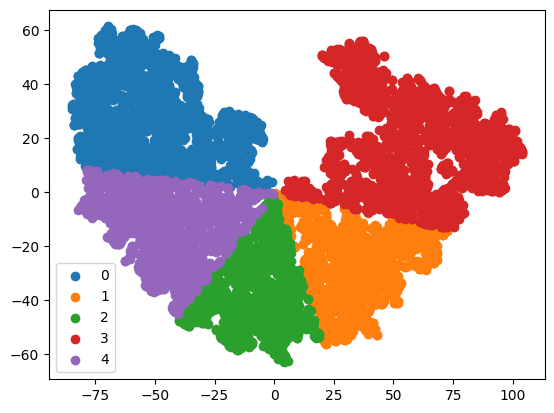

In [67]:
X = model.wv.vectors
X_transforme = TSNE().fit_transform(X)

skmeans = SphericalKmeans(n_clusters=5)
skmeans.fit(X_transforme)
label = skmeans.labels_


u_labels = np.unique(label)

for i in u_labels:
    plt.scatter(X_transforme[label == i , 0] , X_transforme[label == i , 1] , label = i)
plt.legend()
plt.show()

On regarde les scores NMI et ARI :

In [68]:
nmi = normalized_mutual_info_score(vocab_labels2, label)
ari = adjusted_rand_score(vocab_labels2, label)

In [69]:
nmi

0.04939742001502264

In [70]:
ari

0.04895669451313281

On obtient de mauvais resultats, ce qui est confirmé en regardant la vrai répartition des classes après une réduction de dimension t-SNE:


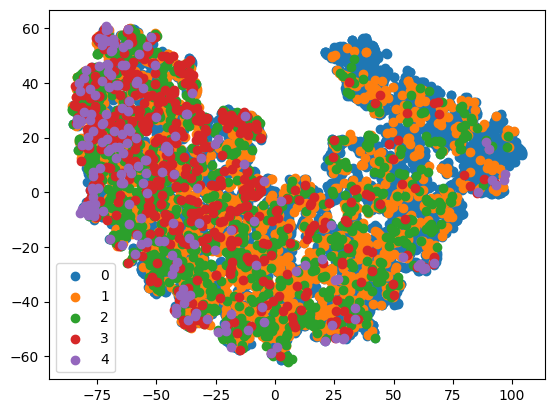

In [71]:
X = model.wv.vectors

label = vocab_labels2
result = TSNE().fit_transform(X)

u_labels = np.unique(vocab_labels2)

for i in u_labels:
    plt.scatter(result[label == i , 0] , result[label == i , 1] , label = i)
plt.legend()
plt.show()

#####UMAP

On fait une réduction de dimension UMAP avant le clustering

De même si on met n_clusters=5 l'algorithme trouve bien le bon nombre de classes, mais sinon il trouve trop de classes

 == New init == 
iteration: 0
7291.072751662114
iteration: 1
9451.737217922113
iteration: 2
9530.817566140557
iteration: 3
9561.622349485575
iteration: 4
9573.87630379038
iteration: 5
9578.399297423353
iteration: 6
9581.49651293063
iteration: 7
9584.22889619433
iteration: 8
9586.212118141208
iteration: 9
9587.379736766388
iteration: 10
9588.125514721669
iteration: 11
9588.65113167494
iteration: 12
9589.269185014085
iteration: 13
9589.998067538294
iteration: 14
9590.840814665615
iteration: 15
9591.57014433095
iteration: 16
9592.249759920178
iteration: 17
9592.897892561203
iteration: 18
9593.293811726935
iteration: 19
9593.408300933874


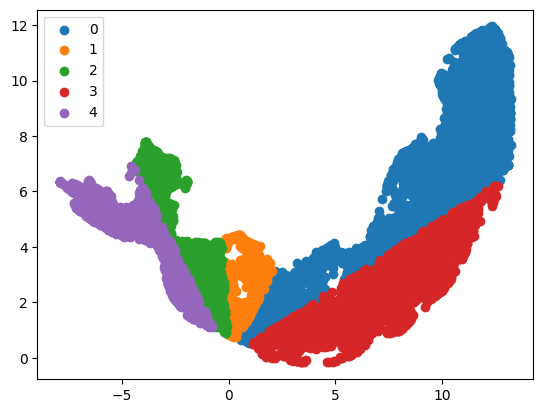

In [72]:
X = model.wv.vectors
X_transforme = umap.UMAP().fit_transform(X)

skmeans = SphericalKmeans(n_clusters=5)
skmeans.fit(X_transforme)
label = skmeans.labels_

u_labels = np.unique(label)

for i in u_labels:
    plt.scatter(X_transforme[label == i , 0] , X_transforme[label == i , 1] , label = i)
plt.legend()
plt.show()

On regarde les metriques NMI et ARI :

In [73]:
nmi = normalized_mutual_info_score(vocab_labels2, label)
ari = adjusted_rand_score(vocab_labels2, label)

In [74]:
nmi

0.042553570263253584

In [75]:
ari

-0.044033405817945605

On obtient de tres mauvais scores NMI et ARI, cela est bien confirmé en regardant la vrai répartition des classes après une réduction de dimension UMAP car on trouve des classes totalement differentes:


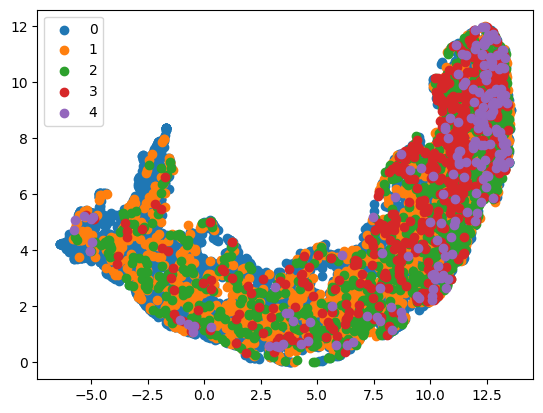

In [76]:
X = model.wv.vectors

label = vocab_labels2
X_transforme = umap.UMAP().fit_transform(X)

u_labels = np.unique(vocab_labels2)

for i in u_labels:
    plt.scatter(X_transforme[label == i , 0] , X_transforme[label == i , 1] , label = i)
plt.legend()
plt.show()

####Clustering Hierarchique

#####Espace d'origine

On fait le clustering hierarchique dans l'espace d'origine. Comme l'algorithme ne trouve pas le bon nombre de classes, on met n_clusters=5 pour qu'on puisse évaluer et comparer avec les autres clusterings


Pour choisir le meilleur critère d'agrégation (single, complete, ward ou average), on regarde la forme et la distribution des vraies classes

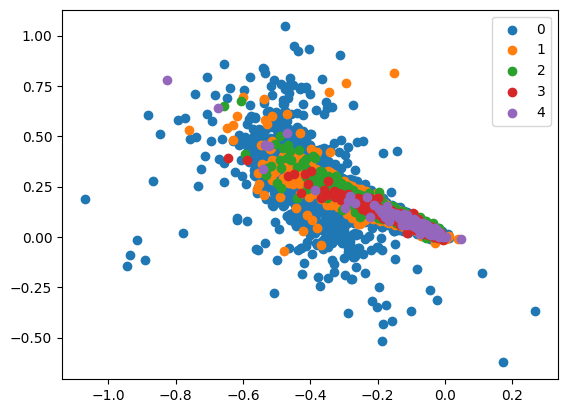

In [77]:
X = model.wv.vectors

label = vocab_labels2

u_labels = np.unique(vocab_labels2)

for i in u_labels:
    plt.scatter(X[label == i , 0] , X[label == i , 1] , label = i)
plt.legend()
plt.show()

Si on utilise single comme critère d'aggrégation, comme les points on une forme allongé, il aura du mal à retrouver les clusters (à cause de l'effet de chaine)

Si on utilise complete il poura bien integrer les points outliers mais ne produira pas forcément de bons clusters

Si on utilise le critère de Ward on aura des clusters d'allure spherique mais comme ils se chevauchent beaucoup on risque d'avoir de mauvais resultats

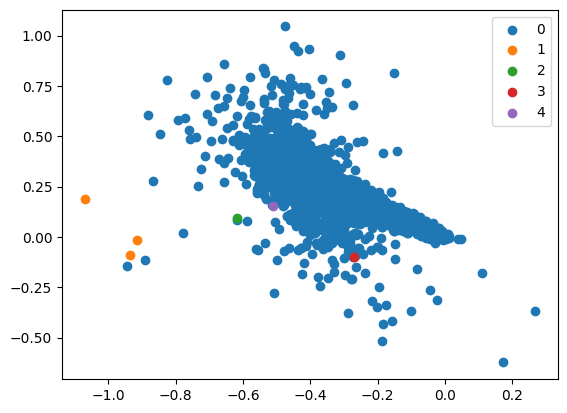

In [78]:
from sklearn.cluster import AgglomerativeClustering

X = model.wv.vectors

clust_hierarchique = AgglomerativeClustering(n_clusters=5, linkage='single')
label = clust_hierarchique.fit_predict(X)

u_labels = np.unique(label)

for i in u_labels:
    plt.scatter(X[label == i , 0] , X[label == i , 1] , label = i)
plt.legend()
plt.show()

En effet on voit qu'avec single il regroupe la majorité des points en un clusters à cause de la forme allongé des points

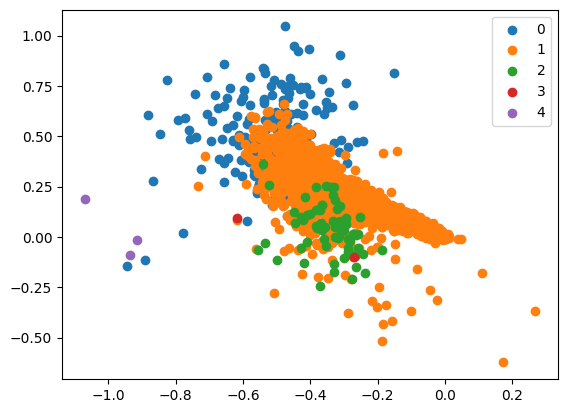

In [79]:
from sklearn.cluster import AgglomerativeClustering

X = model.wv.vectors

clust_hierarchique = AgglomerativeClustering(n_clusters=5, linkage='complete')
label = clust_hierarchique.fit_predict(X)

u_labels = np.unique(label)

for i in u_labels:
    plt.scatter(X[label == i , 0] , X[label == i , 1] , label = i)
plt.legend()
plt.show()

Avec complete il ne trouve pas non plus les bon clusters : il regroupe les points en trois grands clusters

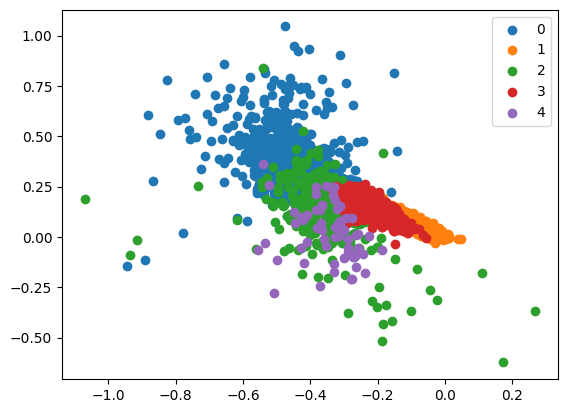

In [80]:
from sklearn.cluster import AgglomerativeClustering

X = model.wv.vectors

clust_hierarchique = AgglomerativeClustering(n_clusters=5, linkage='ward')
label = clust_hierarchique.fit_predict(X)

u_labels = np.unique(label)

for i in u_labels:
    plt.scatter(X[label == i , 0] , X[label == i , 1] , label = i)
plt.legend()
plt.show()

In [81]:
nmi = normalized_mutual_info_score(vocab_labels2, label)
ari = adjusted_rand_score(vocab_labels2, label)

In [82]:
nmi

0.05266252144100699

In [83]:
ari

-0.07207963389798193

Le critère de ward nous donne le meilleur clustering, même si les metriques NMI et ARI restent très mauvaises       

#####ACP

On fait une ACP avant le clustering

De même si on met n_clusters=5 l'algorithme trouve bien le bon nombre de classes, mais sinon il trouve trop de classes

On regarde la forme des vrais clusters (après l'ACP) pour choisir le critère d'aggregation

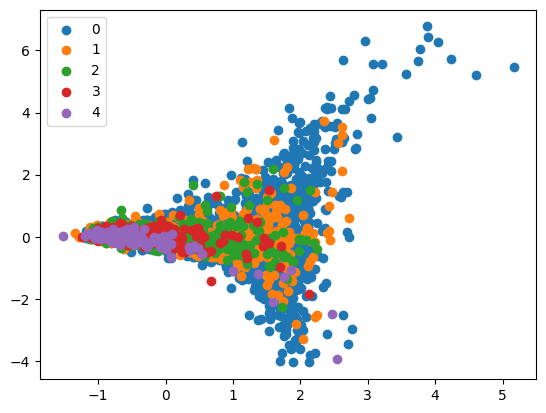

In [84]:
X = model.wv.vectors

label = vocab_labels2
pca = PCA(n_components=2)
result = pca.fit_transform(X)

u_labels = np.unique(vocab_labels2)

for i in u_labels:
    plt.scatter(result[label == i , 0] , result[label == i , 1] , label = i)
plt.legend()
plt.show()

Comme précédement, le critere single ne produira pas un bon clustering car les points sont regroupés de facon allongé

Le critere de ward aura aussi probablement du mal car les clusters se chevauchent et n'ont pas trop une forme spherique

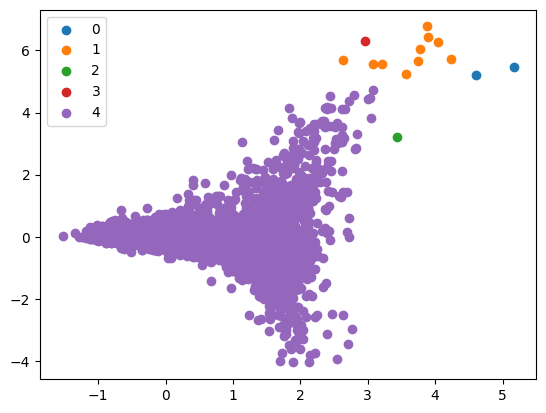

In [85]:
X = model.wv.vectors
pca = PCA(n_components=2)
result = pca.fit_transform(X)

clust_hierarchique = AgglomerativeClustering(n_clusters=5, linkage='single')
label = clust_hierarchique.fit_predict(result)

u_labels = np.unique(label)

for i in u_labels:
    plt.scatter(result[label == i , 0] , result[label == i , 1] , label = i)
plt.legend()
plt.show()

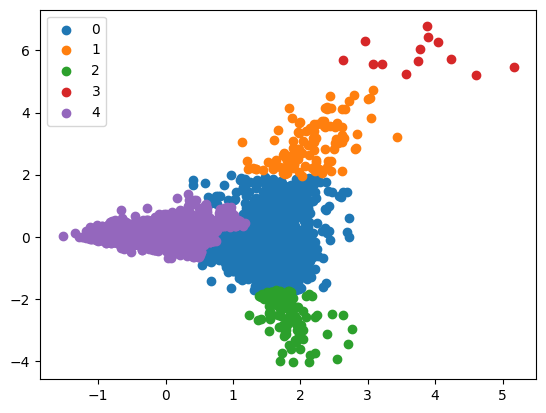

In [86]:
X = model.wv.vectors
pca = PCA(n_components=2)
result = pca.fit_transform(X)

clust_hierarchique = AgglomerativeClustering(n_clusters=5, linkage='complete')
label = clust_hierarchique.fit_predict(result)

u_labels = np.unique(label)

for i in u_labels:
    plt.scatter(result[label == i , 0] , result[label == i , 1] , label = i)
plt.legend()
plt.show()

In [87]:
nmi = normalized_mutual_info_score(vocab_labels2, label)
ari = adjusted_rand_score(vocab_labels2, label)

In [88]:
nmi

0.04871496095051635

In [89]:
ari

-0.0903366976496433

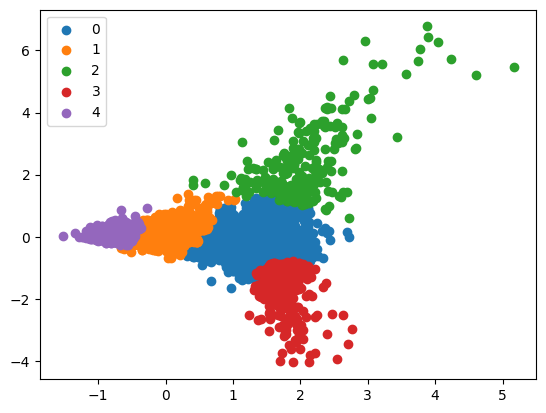

In [90]:
X = model.wv.vectors
pca = PCA(n_components=2)
result = pca.fit_transform(X)

clust_hierarchique = AgglomerativeClustering(n_clusters=5, linkage='ward')
label = clust_hierarchique.fit_predict(result)

u_labels = np.unique(label)

for i in u_labels:
    plt.scatter(result[label == i , 0] , result[label == i , 1] , label = i)
plt.legend()
plt.show()

In [91]:
nmi = normalized_mutual_info_score(vocab_labels2, label)
ari = adjusted_rand_score(vocab_labels2, label)

In [92]:
nmi

0.050403743023385066

In [93]:
ari

-0.03125354860691126

On obtient des métriques très mauvaises pour chaque critère, mais le clustering marche le mieux avec le critère ward

#####T-SNE

On fait une reduction de dimension de type t-SNE avant le clustering hierarchique

De même si on met n_clusters=5 l'algorithme trouve bien le bon nombre de classes, mais sinon il trouve trop de classes

On regarde par ailleurs la forme des vrais clusters pour choisir le critere d'aggregation


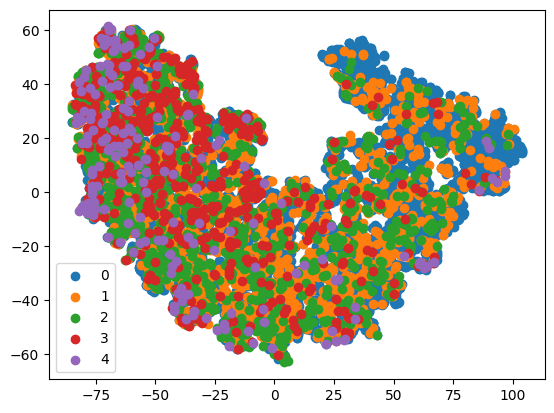

In [94]:
X = model.wv.vectors

label = vocab_labels2
X_transforme = TSNE().fit_transform(X)

u_labels = np.unique(vocab_labels2)

for i in u_labels:
    plt.scatter(X_transforme[label == i , 0] , X_transforme[label == i , 1] , label = i)
plt.legend()
plt.show()


Comme précédement, le critere single et complete ne trouveront probablement pas les bon clusters, mais comme on a une forme spherique (et que les clusters se chevauchent beaucoup), même le critère de ward risque de ne pas trouver les bon clusters



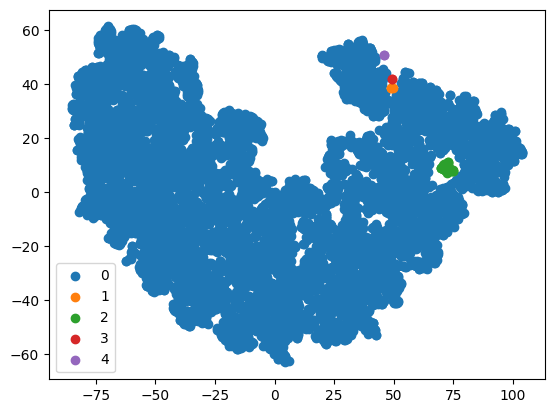

In [95]:
X = model.wv.vectors
X_transforme = TSNE().fit_transform(X)

clust_hierarchique = AgglomerativeClustering(n_clusters=5, linkage='single')
label = clust_hierarchique.fit_predict(X_transforme)

u_labels = np.unique(label)

for i in u_labels:
    plt.scatter(X_transforme[label == i , 0] , X_transforme[label == i , 1] , label = i)
plt.legend()
plt.show()

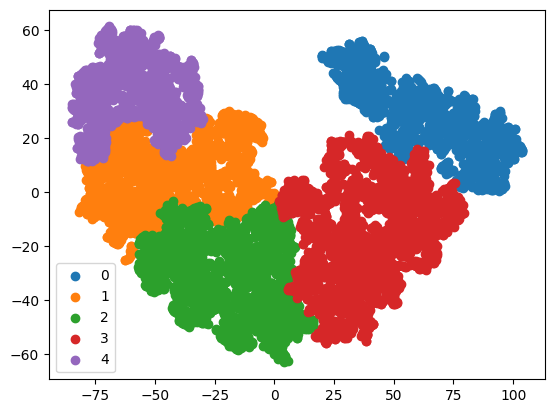

In [96]:
X = model.wv.vectors
X_transforme = TSNE().fit_transform(X)

clust_hierarchique = AgglomerativeClustering(n_clusters=5, linkage='complete')
label = clust_hierarchique.fit_predict(X_transforme)

u_labels = np.unique(label)

for i in u_labels:
    plt.scatter(X_transforme[label == i , 0] , X_transforme[label == i , 1] , label = i)
plt.legend()
plt.show()

In [97]:
nmi = normalized_mutual_info_score(vocab_labels2, label)
ari = adjusted_rand_score(vocab_labels2, label)

In [98]:
nmi

0.04936623785882215

In [99]:
ari

0.03672505983198971

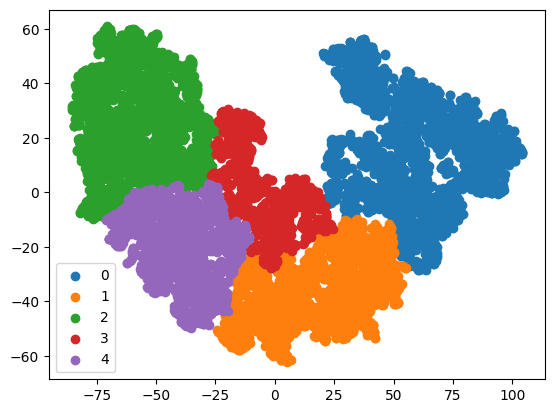

In [101]:
X = model.wv.vectors
X_transforme = TSNE().fit_transform(X)

clust_hierarchique = AgglomerativeClustering(n_clusters=5, linkage='ward')
label = clust_hierarchique.fit_predict(X_transforme)

u_labels = np.unique(label)

for i in u_labels:
    plt.scatter(X_transforme[label == i , 0] , X_transforme[label == i , 1] , label = i)
plt.legend()
plt.show()

In [102]:
nmi = normalized_mutual_info_score(vocab_labels2, label)
ari = adjusted_rand_score(vocab_labels2, label)

In [103]:
nmi

0.048185744584218745

In [104]:
ari

0.0562439959487805

Chaque critère donne un tres mauvais clustering mais le meilleur critère reste complete

#####UMAP

On fait une reduction de dimension de type UMAP avant le clustering hierarchique

De même si on met n_clusters=5 l'algorithme trouve bien le bon nombre de classes, mais sinon il trouve trop de classes

On regarde par ailleurs la forme des vrais clusters pour choisir le meilleur critere d'aggregation

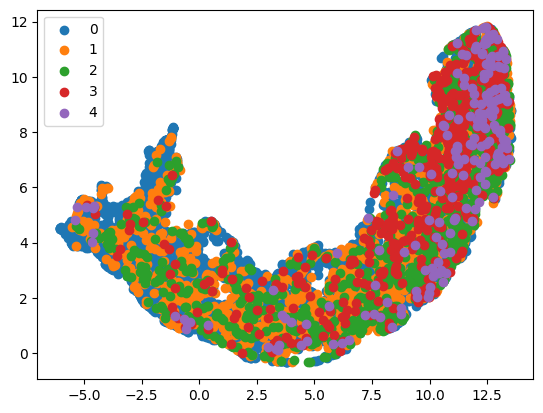

In [105]:
X = model.wv.vectors

label = vocab_labels2
X_transforme = umap.UMAP().fit_transform(X)

u_labels = np.unique(vocab_labels2)

for i in u_labels:
    plt.scatter(X_transforme[label == i , 0] , X_transforme[label == i , 1] , label = i)
plt.legend()
plt.show()

Comme les clusters se chevauchent énormément et n'ont pas une forme spherique, les differents critères risquent de pas trover les bons clusters


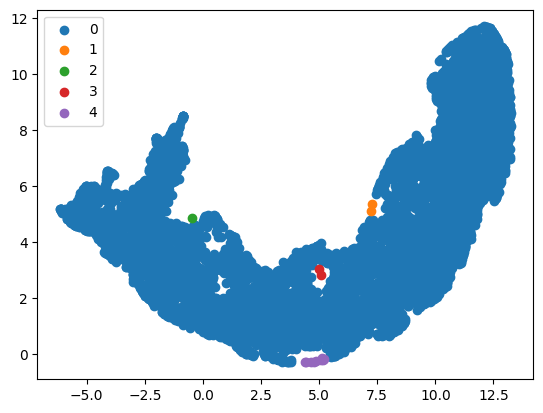

In [106]:
X = model.wv.vectors
X_transforme = umap.UMAP().fit_transform(X)

clust_hierarchique = AgglomerativeClustering(n_clusters=5, linkage='single')
label = clust_hierarchique.fit_predict(X_transforme)

u_labels = np.unique(label)

for i in u_labels:
    plt.scatter(X_transforme[label == i , 0] , X_transforme[label == i , 1] , label = i)
plt.legend()
plt.show()

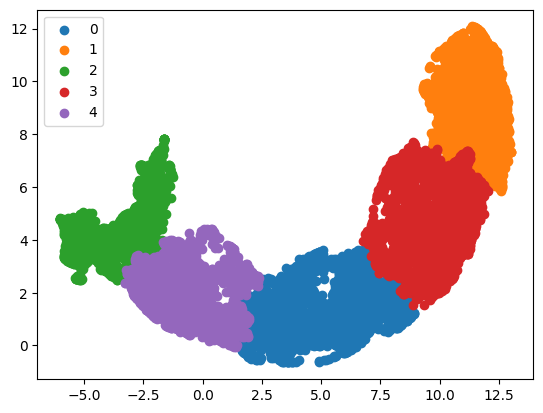

In [107]:
X = model.wv.vectors
X_transforme = umap.UMAP().fit_transform(X)

clust_hierarchique = AgglomerativeClustering(n_clusters=5, linkage='complete')
label = clust_hierarchique.fit_predict(X_transforme)

u_labels = np.unique(label)

for i in u_labels:
    plt.scatter(X_transforme[label == i , 0] , X_transforme[label == i , 1] , label = i)
plt.legend()
plt.show()

In [108]:
nmi = normalized_mutual_info_score(vocab_labels2, label)
ari = adjusted_rand_score(vocab_labels2, label)

In [109]:
nmi

0.04957187592125544

In [110]:
ari

0.009641046108049481

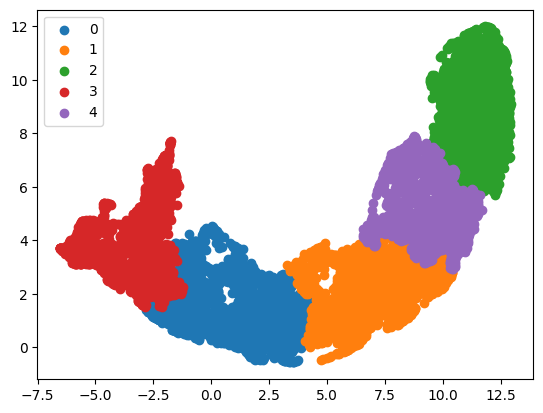

In [111]:
X = model.wv.vectors
X_transforme = umap.UMAP().fit_transform(X)

clust_hierarchique = AgglomerativeClustering(n_clusters=5, linkage='ward')
label = clust_hierarchique.fit_predict(X_transforme)

u_labels = np.unique(label)

for i in u_labels:
    plt.scatter(X_transforme[label == i , 0] , X_transforme[label == i , 1] , label = i)
plt.legend()
plt.show()

In [112]:
nmi = normalized_mutual_info_score(vocab_labels2, label)
ari = adjusted_rand_score(vocab_labels2, label)

In [113]:
nmi

0.04937899654930877

In [114]:
ari

0.022950853177023577

On voit que chaque critère donne un très mauvais clustering (même le critère de ward), ce qui est confirmé par les métriques

####Nombre de clusters

On utilise la methode du coude, le coefficient de silhouette et le coefficient calinski_harabasz pour estimer le nombre de clusters pour chaque méthode de clustering

#####Kmeans

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

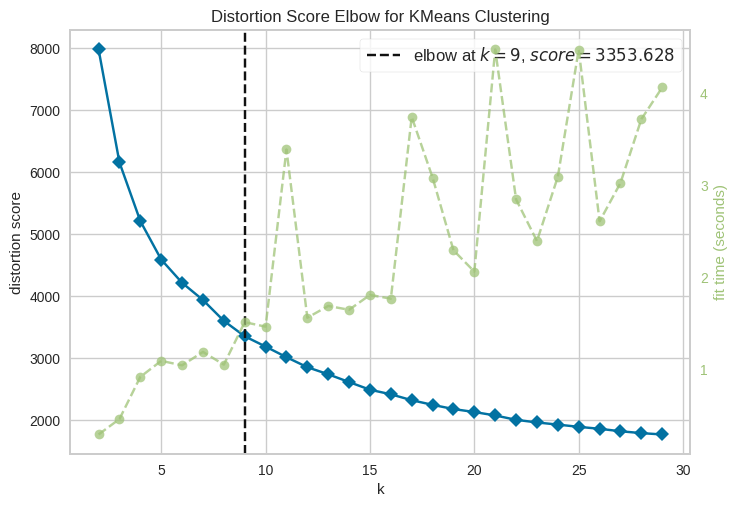

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [115]:
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import KMeans

X = model.wv.vectors
km = KMeans()
visualizer = KElbowVisualizer(km, k=(2,30), timings= True)
visualizer.fit(X)
visualizer.show() 

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

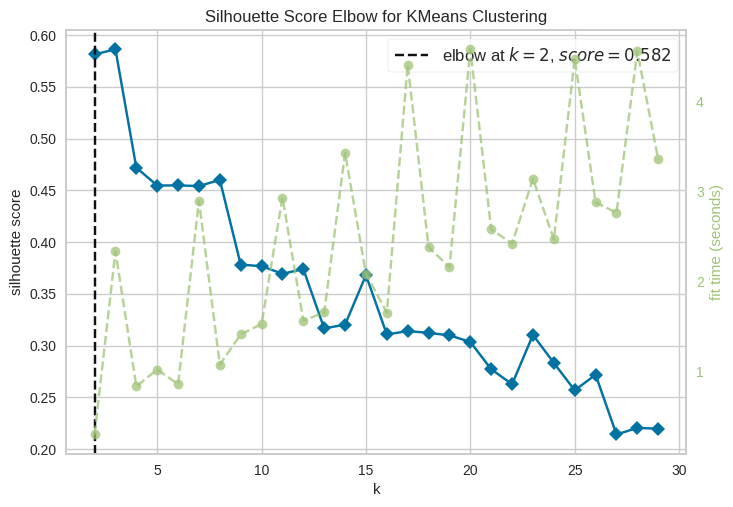

<Axes: title={'center': 'Silhouette Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='silhouette score'>

In [116]:
from yellowbrick.cluster import KElbowVisualizer

X = model.wv.vectors
km = KMeans()

visualizer = KElbowVisualizer(km, k=(2,30),metric='silhouette', timings= True)
visualizer.fit(X)
visualizer.show() 

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

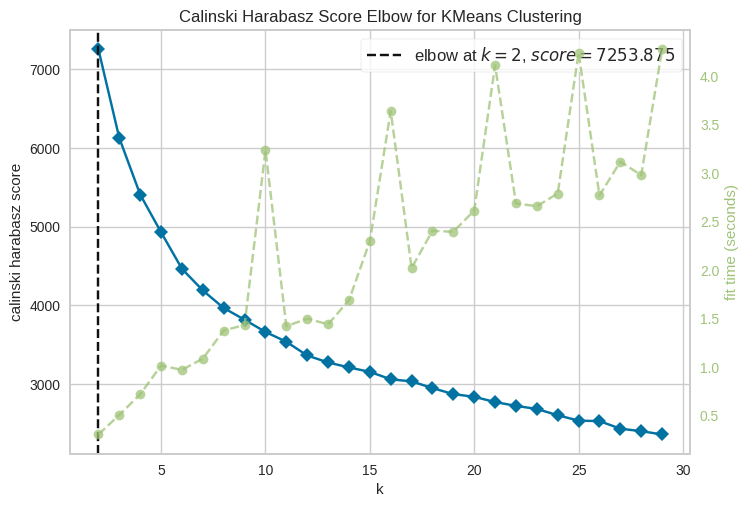

<Axes: title={'center': 'Calinski Harabasz Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='calinski harabasz score'>

In [117]:
from yellowbrick.cluster import KElbowVisualizer

X = model.wv.vectors
km = KMeans()

visualizer = KElbowVisualizer(km, k=(2,30),metric='calinski_harabasz', timings= True)
visualizer.fit(X)
visualizer.show() 

Pour Kmeans, la méthode du coude donne 9 clusters, le coefficient Silhouette donne 2 clusters et le coefficient Calinski Harabasz donne 2 clusters

#####Kmedoids

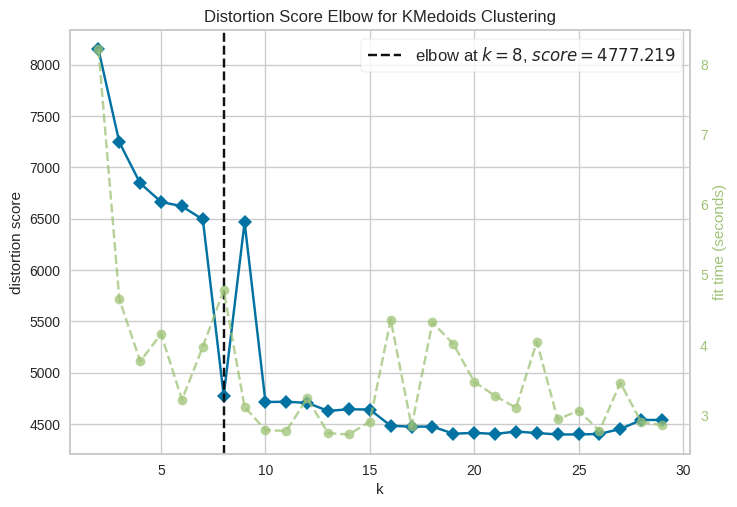

<Axes: title={'center': 'Distortion Score Elbow for KMedoids Clustering'}, xlabel='k', ylabel='distortion score'>

In [118]:
from yellowbrick.cluster import KElbowVisualizer

X = model.wv.vectors
km = KMedoids()

visualizer = KElbowVisualizer(km, k=(2,30), timings= True)
visualizer.fit(X)
visualizer.show() 

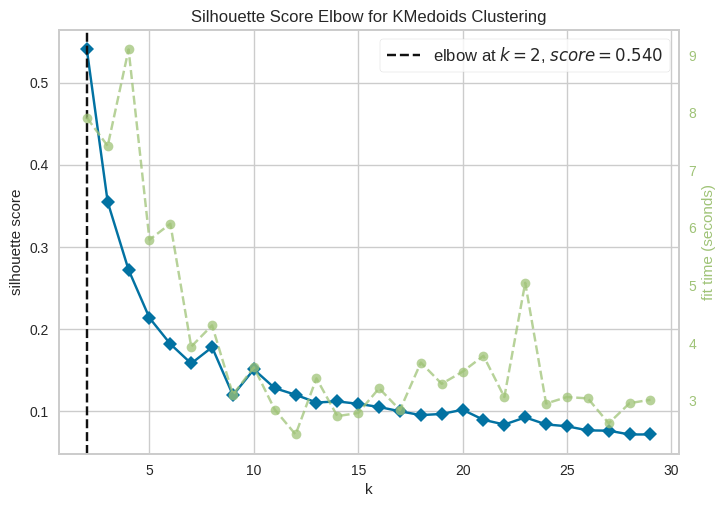

<Axes: title={'center': 'Silhouette Score Elbow for KMedoids Clustering'}, xlabel='k', ylabel='silhouette score'>

In [119]:
from yellowbrick.cluster import KElbowVisualizer

X = model.wv.vectors
km = KMedoids()

visualizer = KElbowVisualizer(km, k=(2,30),metric='silhouette', timings= True)
visualizer.fit(X)
visualizer.show() 

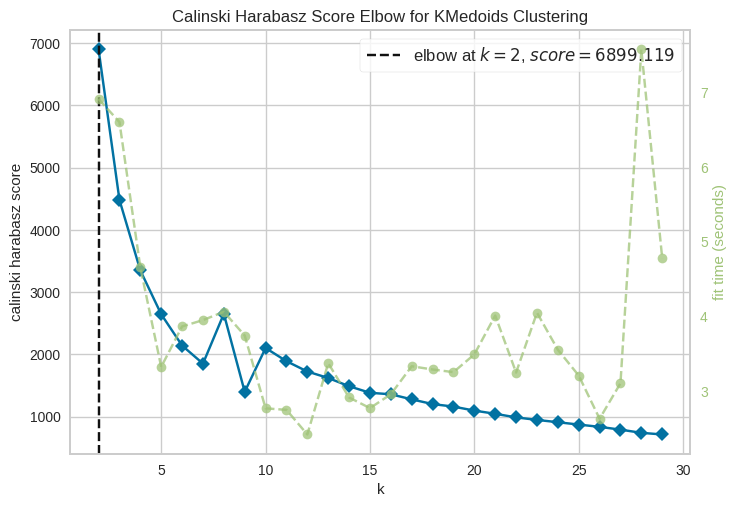

<Axes: title={'center': 'Calinski Harabasz Score Elbow for KMedoids Clustering'}, xlabel='k', ylabel='calinski harabasz score'>

In [120]:
from yellowbrick.cluster import KElbowVisualizer


X = model.wv.vectors
km = KMedoids()

visualizer = KElbowVisualizer(km, k=(2,30),metric='calinski_harabasz', timings= True)
visualizer.fit(X)
visualizer.show() 

Pour Kmedoids, la méthode du coude donne 8 clusters, le coefficient Silhouette donne 2 clusters et le coefficient Calinski Harabasz donne aussi 2 clusters

#####Spherical Kmeans

La méthode KElbowVisualizer du package yellowbrick.cluster ne permet pas d'obtenir les coefficients pour un modèle de type Spherical Kmeans

In [ ]:
from yellowbrick.cluster import KElbowVisualizer
from coclust.clustering import SphericalKmeans

X = model.wv.vectors
spherical = SphericalKmeans()

visualizer = KElbowVisualizer(spherical, k=(2,30), timings= True)
visualizer.fit(X)
visualizer.show() 

YellowbrickTypeError: ignored

#####Clustering hierarchique

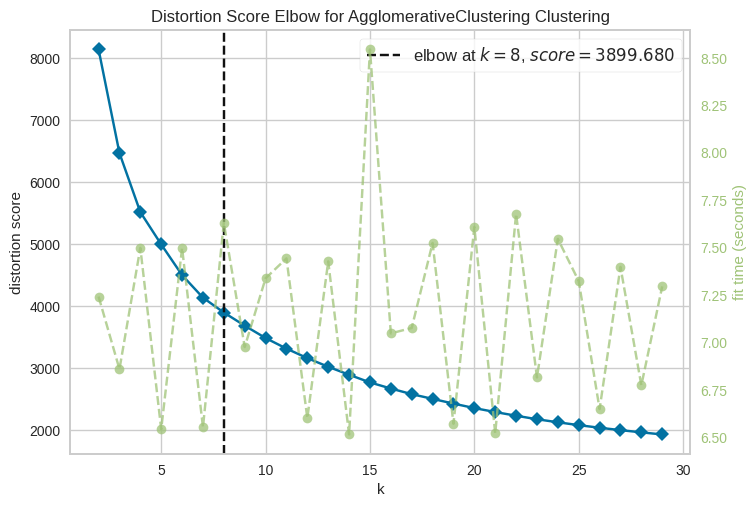

<Axes: title={'center': 'Distortion Score Elbow for AgglomerativeClustering Clustering'}, xlabel='k', ylabel='distortion score'>

In [121]:
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import AgglomerativeClustering

X = model.wv.vectors
clust_hier = AgglomerativeClustering()

visualizer = KElbowVisualizer(clust_hier, k=(2,30), timings= True)
visualizer.fit(X)
visualizer.show()

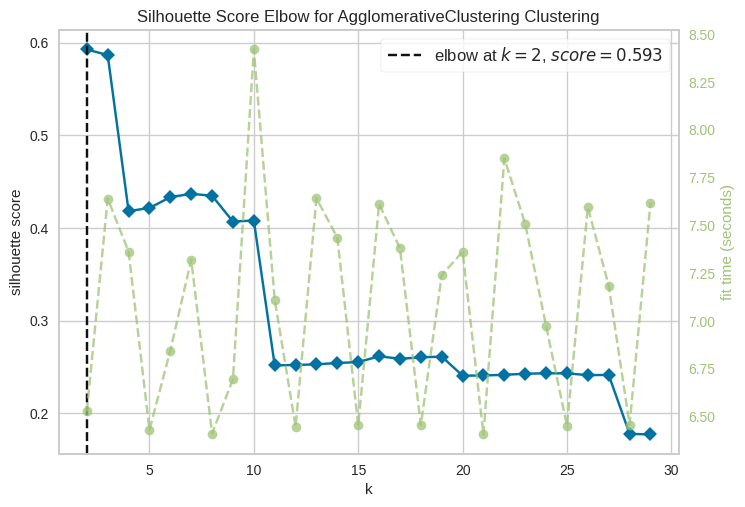

<Axes: title={'center': 'Silhouette Score Elbow for AgglomerativeClustering Clustering'}, xlabel='k', ylabel='silhouette score'>

In [122]:
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import AgglomerativeClustering

X = model.wv.vectors
clust_hier = AgglomerativeClustering()

visualizer = KElbowVisualizer(clust_hier, k=(2,30),metric='silhouette', timings= True)
visualizer.fit(X)
visualizer.show()

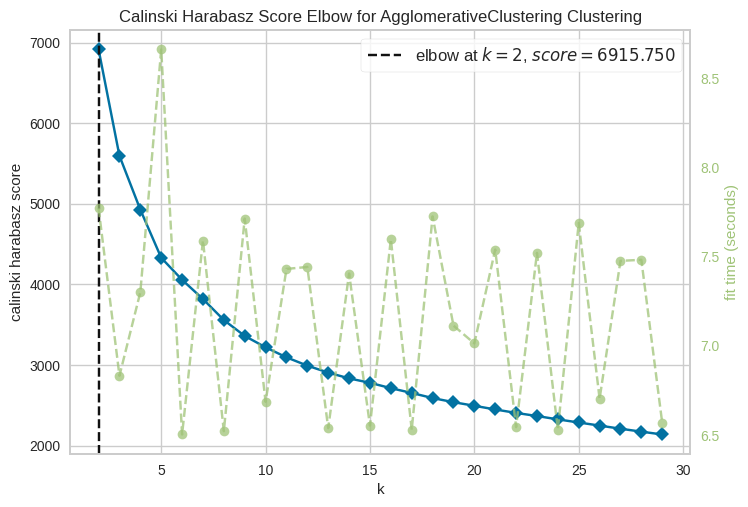

<Axes: title={'center': 'Calinski Harabasz Score Elbow for AgglomerativeClustering Clustering'}, xlabel='k', ylabel='calinski harabasz score'>

In [123]:
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import AgglomerativeClustering

X = model.wv.vectors
clust_hier = AgglomerativeClustering()

visualizer = KElbowVisualizer(clust_hier, k=(2,30),metric='calinski_harabasz', timings= True)
visualizer.fit(X)
visualizer.show()

Pour le clustering hierarchique, la méthode du coude donne 8 clusters, le coefficient Silhouette donne 2 clusters et le coefficient Calinski Harabasz donne aussi 2 clusters

#####Remarque

Pour chaque type de clustering, la méthode du coude donne 8clusters, et le coefficient silhouette et calinski harabasz donnent 2 clusters

On teste pour voir si en utilisant ces nombres de clusters on améliore le clustering

Pour Kmeans :

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


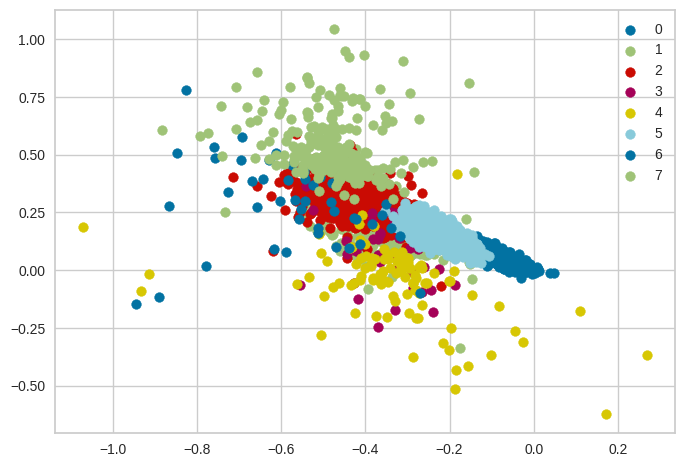

In [124]:
from sklearn.cluster import KMeans

X = model.wv.vectors

kmeans = KMeans(n_clusters=8)
label = kmeans.fit_predict(X)

u_labels = np.unique(label)

for i in u_labels:
    plt.scatter(X[label == i , 0] , X[label == i , 1] , label = i)
plt.legend()
plt.show()

In [125]:
from sklearn.metrics import normalized_mutual_info_score
from sklearn.metrics import adjusted_rand_score

nmi = normalized_mutual_info_score(vocab_labels2, label)
ari = adjusted_rand_score(vocab_labels2, label)

In [126]:
nmi

0.051916451099682605

In [127]:
ari

-0.08632265624027709

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


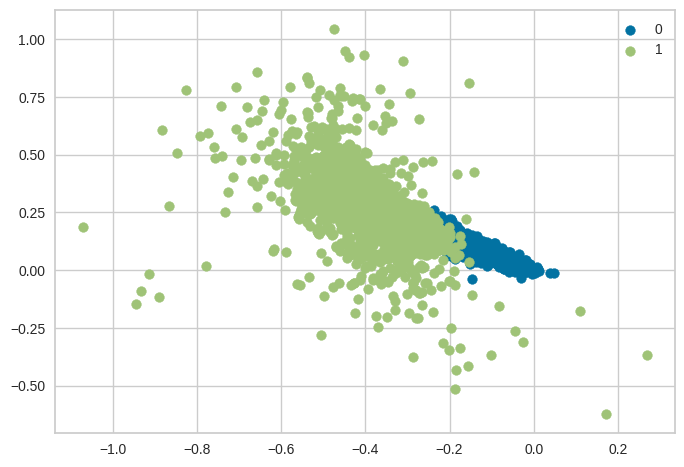

In [128]:
from sklearn.cluster import KMeans

X = model.wv.vectors

kmeans = KMeans(n_clusters=2)
label = kmeans.fit_predict(X)

u_labels = np.unique(label)

for i in u_labels:
    plt.scatter(X[label == i , 0] , X[label == i , 1] , label = i)
plt.legend()
plt.show()

In [129]:
nmi = normalized_mutual_info_score(vocab_labels2, label)
ari = adjusted_rand_score(vocab_labels2, label)

In [130]:
nmi

0.05168893813582926

In [131]:
ari

-0.06118145538888914

Pour Kmedoids :

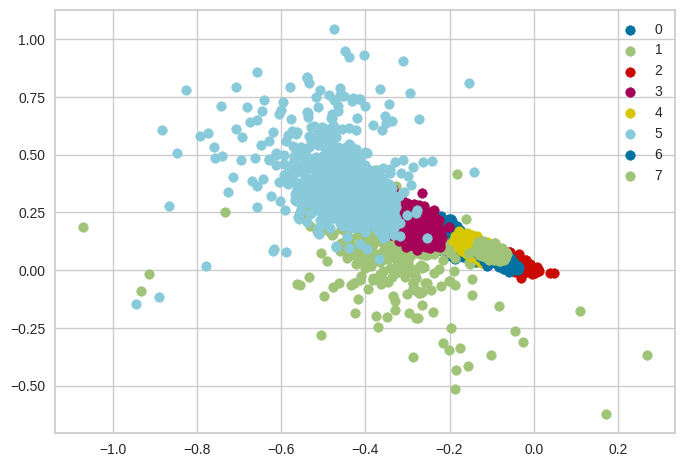

In [132]:
from sklearn_extra.cluster import KMedoids

X = model.wv.vectors

kmedoids = KMedoids(n_clusters=8)
label = kmedoids.fit_predict(X)

u_labels = np.unique(label)

for i in u_labels:
    plt.scatter(X[label == i , 0] , X[label == i , 1] , label = i)
plt.legend()
plt.show()

In [133]:
nmi = normalized_mutual_info_score(vocab_labels2, label)
ari = adjusted_rand_score(vocab_labels2, label)

In [134]:
nmi

0.04511122183579704

In [135]:
ari

-0.003225826279506507

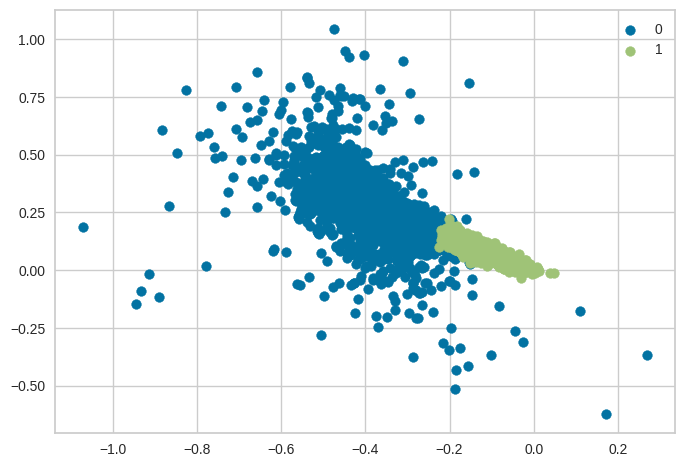

In [136]:
from sklearn_extra.cluster import KMedoids

X = model.wv.vectors

kmedoids = KMedoids(n_clusters=2)
label = kmedoids.fit_predict(X)

u_labels = np.unique(label)

for i in u_labels:
    plt.scatter(X[label == i , 0] , X[label == i , 1] , label = i)
plt.legend()
plt.show()

In [137]:
nmi = normalized_mutual_info_score(vocab_labels2, label)
ari = adjusted_rand_score(vocab_labels2, label)

In [138]:
nmi

0.05502751978828948

In [139]:
ari

-0.030810469053862886

Pour Spherical Kmeans :

 == New init == 
iteration: 0
9207.89148000698
iteration: 1
9377.527379871077
iteration: 2
9407.22649510021
iteration: 3
9421.083636112966
iteration: 4
9429.570077880086
iteration: 5
9435.176692710646
iteration: 6
9438.350241888507
iteration: 7
9440.487254457697
iteration: 8
9442.079737727443
iteration: 9
9443.24136739443
iteration: 10
9443.935073069148
iteration: 11
9444.444728190854
iteration: 12
9444.799991410244
iteration: 13
9445.029484304556
iteration: 14
9445.225229047464
iteration: 15
9445.401092926786
iteration: 16
9445.533058840094
iteration: 17
9445.660760746106
iteration: 18
9445.779471022634
iteration: 19
9445.868182907241


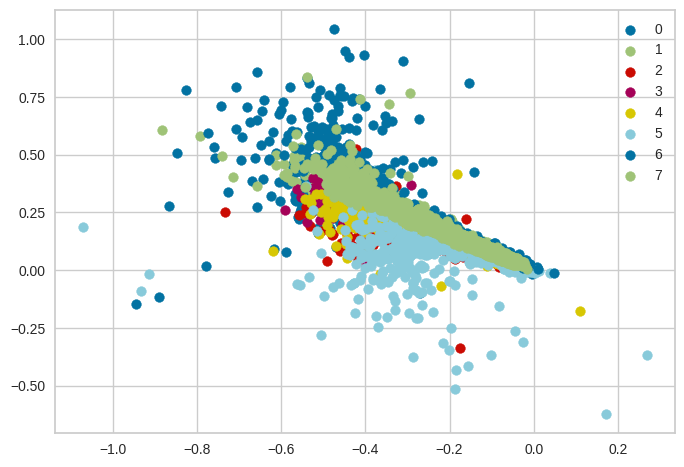

In [140]:
from coclust.clustering import SphericalKmeans

X = model.wv.vectors

skmeans = SphericalKmeans(n_clusters=8)
skmeans.fit(X)
label = skmeans.labels_

u_labels = np.unique(label)

for i in u_labels:
    plt.scatter(X[label == i , 0] , X[label == i , 1] , label = i)
plt.legend()
plt.show()

In [141]:
nmi = normalized_mutual_info_score(vocab_labels2, label)
ari = adjusted_rand_score(vocab_labels2, label)

In [142]:
nmi

0.015682508494376215

In [143]:
ari

-0.0031100093615347656

 == New init == 
iteration: 0
9192.601637082931
iteration: 1
9304.197535828289
iteration: 2
9320.037895803824
iteration: 3
9322.39023223006
iteration: 4
9323.421042088688
iteration: 5
9324.092336962523
iteration: 6
9324.535713582625
iteration: 7
9324.773352678681
iteration: 8
9324.899211395972
iteration: 9
9324.955727539815
iteration: 10
9324.988408340803
iteration: 11
9325.017253415455
iteration: 12
9325.041264135933
iteration: 13
9325.048512511952
iteration: 14
9325.053515342453
iteration: 15
9325.057897909479
iteration: 16
9325.059780635105
iteration: 17
9325.06035131314
iteration: 18
9325.060779624459
iteration: 19
9325.06129275007


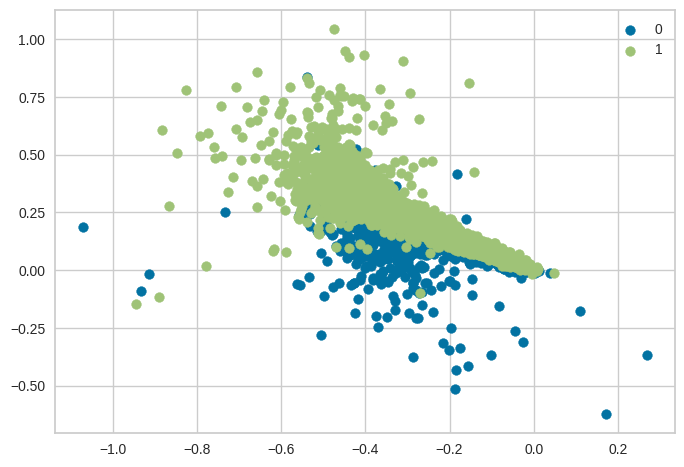

In [144]:
from coclust.clustering import SphericalKmeans

X = model.wv.vectors

skmeans = SphericalKmeans(n_clusters=2)
skmeans.fit(X)
label = skmeans.labels_

u_labels = np.unique(label)

for i in u_labels:
    plt.scatter(X[label == i , 0] , X[label == i , 1] , label = i)
plt.legend()
plt.show()

In [145]:
nmi = normalized_mutual_info_score(vocab_labels2, label)
ari = adjusted_rand_score(vocab_labels2, label)

In [146]:
nmi

0.005263125564654343

In [147]:
ari

-0.019594186674292857

Pour le clustering hierarchique:

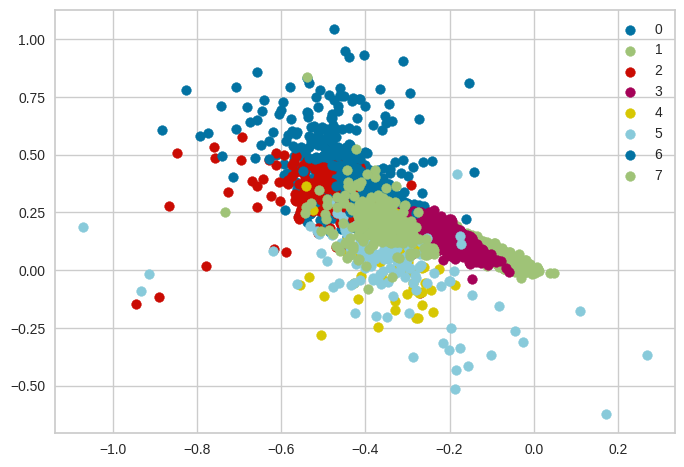

In [148]:
from sklearn.cluster import AgglomerativeClustering

X = model.wv.vectors

clust_hierarchique = AgglomerativeClustering(n_clusters=8, linkage='ward')
label = clust_hierarchique.fit_predict(X)

u_labels = np.unique(label)

for i in u_labels:
    plt.scatter(X[label == i , 0] , X[label == i , 1] , label = i)
plt.legend()
plt.show()

In [149]:
nmi = normalized_mutual_info_score(vocab_labels2, label)
ari = adjusted_rand_score(vocab_labels2, label)

In [150]:
nmi

0.05205739240013687

In [151]:
ari

-0.0853181006456167

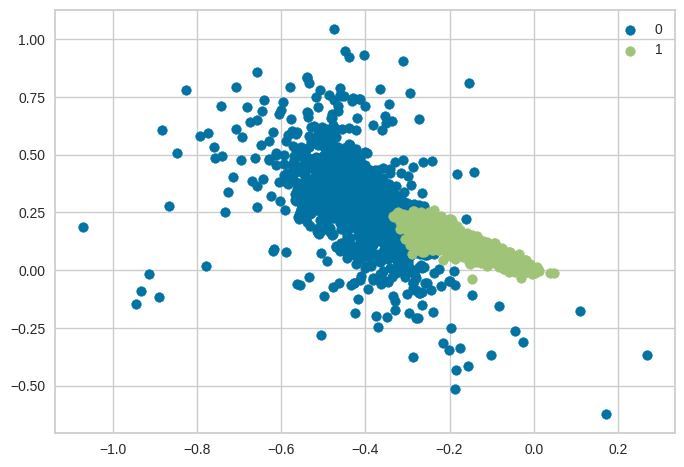

In [153]:
from sklearn.cluster import AgglomerativeClustering

X = model.wv.vectors

clust_hierarchique = AgglomerativeClustering(n_clusters=2, linkage='ward')
label = clust_hierarchique.fit_predict(X)

u_labels = np.unique(label)

for i in u_labels:
    plt.scatter(X[label == i , 0] , X[label == i , 1] , label = i)
plt.legend()
plt.show()

In [154]:
nmi = normalized_mutual_info_score(vocab_labels2, label)
ari = adjusted_rand_score(vocab_labels2, label)

In [155]:
nmi

0.05022782103885729

In [156]:
ari

-0.0744629156782346


On voit que en prenant 2 clusters et 8 clusters on obtient des resultats très similaires (ou très légerement meilleurs) pour chaque clustering, ces résultats restent quand même très mauvais



####Partie 1 : Conclusion 

On a les tableaux récapitulatifs suivants pour 5 clusters:

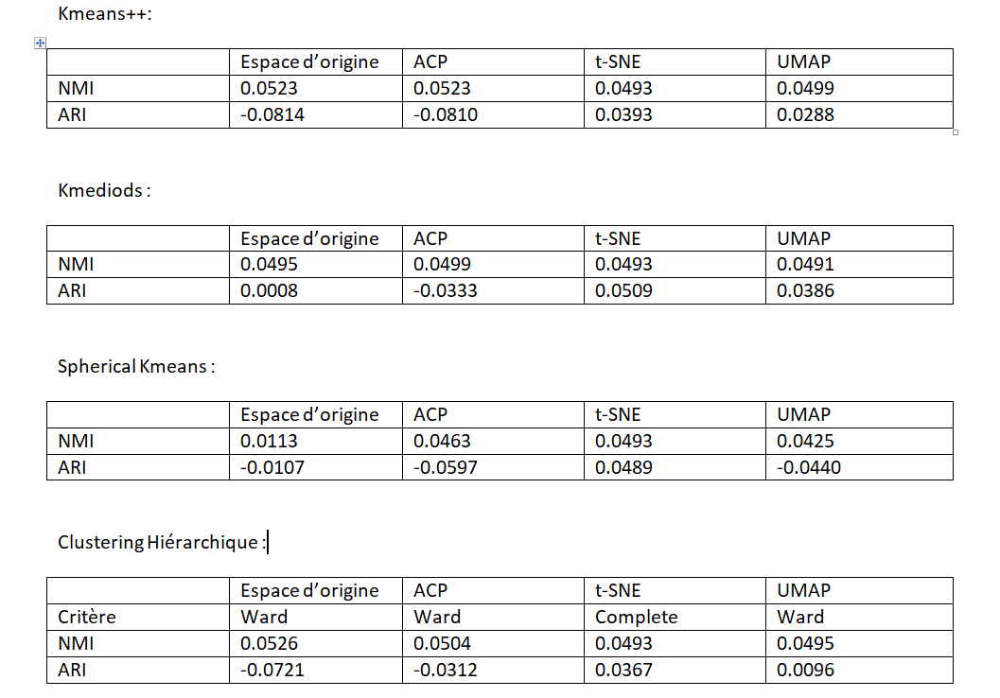

De manière générale les differents clusterings donnent de très mauvais resultats.

Pour chaque clustering on obtient des résultats très similaires pour chaque méthode de réduction de dimension (mise à part pour le spherical kmeans qui est beaucoup moins performant dans l'espace d'origine)



Ces resultats ne permettent pas vraiment d'appuyer les remarques faites pour les deux autres datasets.

###Partie 2: Approche jointe/simultanée


####Reduced Kmeans

Je n'ai pas trouvé d'implementation de reduced k-means en python

####Deep Kmeans

Pour Deep Kmeans je n'arrive pas à installer le package. On a l'erreur ci-dessous qui dit qu'il ne trouve pas de projet python car il manque les fichiers setup.py et pyproject.toml. En effet en regardant le github, on voit que ces fichiers n'existent pas. Par ailleurs il n'y a pas de documentation pour expliquer l'installation

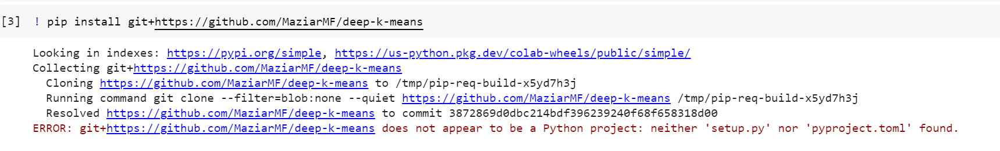

In [ ]:
! pip install git+https://github.com/MaziarMF/deep-k-means

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/MaziarMF/deep-k-means to /tmp/pip-req-build-yv4f2452
  Running command git clone --filter=blob:none --quiet https://github.com/MaziarMF/deep-k-means /tmp/pip-req-build-yv4f2452
  Resolved https://github.com/MaziarMF/deep-k-means to commit 3872869d0dbc214bdf396239240f68f658318d00
ERROR: git+https://github.com/MaziarMF/deep-k-means does not appear to be a Python project: neither 'setup.py' nor 'pyproject.toml' found.
